# Test 2; with gravity data noise

import packages

In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import logging
import os
import pathlib
import pickle
import string

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as sp
import verde as vd
import xarray as xr
from polartoolkit import maps, profiles
from polartoolkit import utils as polar_utils

import synthetic_bathymetry_inversion.plotting as synth_plotting
from synthetic_bathymetry_inversion import synthetic

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import inversion, plotting, regional, uncertainty, utils

In [2]:
fpath = "../results/Ross_Sea/Ross_Sea_02"

# Get synthetic model data

INFO:polartoolkit:changing grid region, spacing and/or registration
INFO:polartoolkit:requested spacing (2000.0) larger than original (500.0), filtering before resampling
grdsample [WARNING]: Output sampling interval in x exceeds input interval and may lead to aliasing.
grdsample [WARNING]: Output sampling interval in y exceeds input interval and may lead to aliasing.
INFO:polartoolkit:converting to be reference to the WGS84 ellipsoid
INFO:polartoolkit:changing grid region, spacing and/or registration


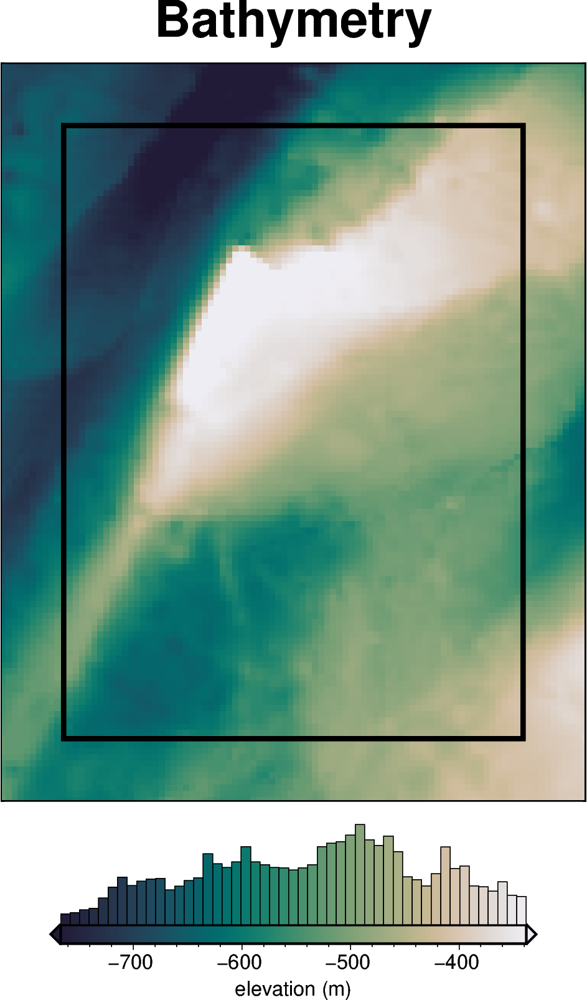

  0%|          | 0/7676 [00:00<?, ?it/s]

INFO:invert4geom:Standard deviation used for noise: [3.0]
INFO:polartoolkit:returning original grid


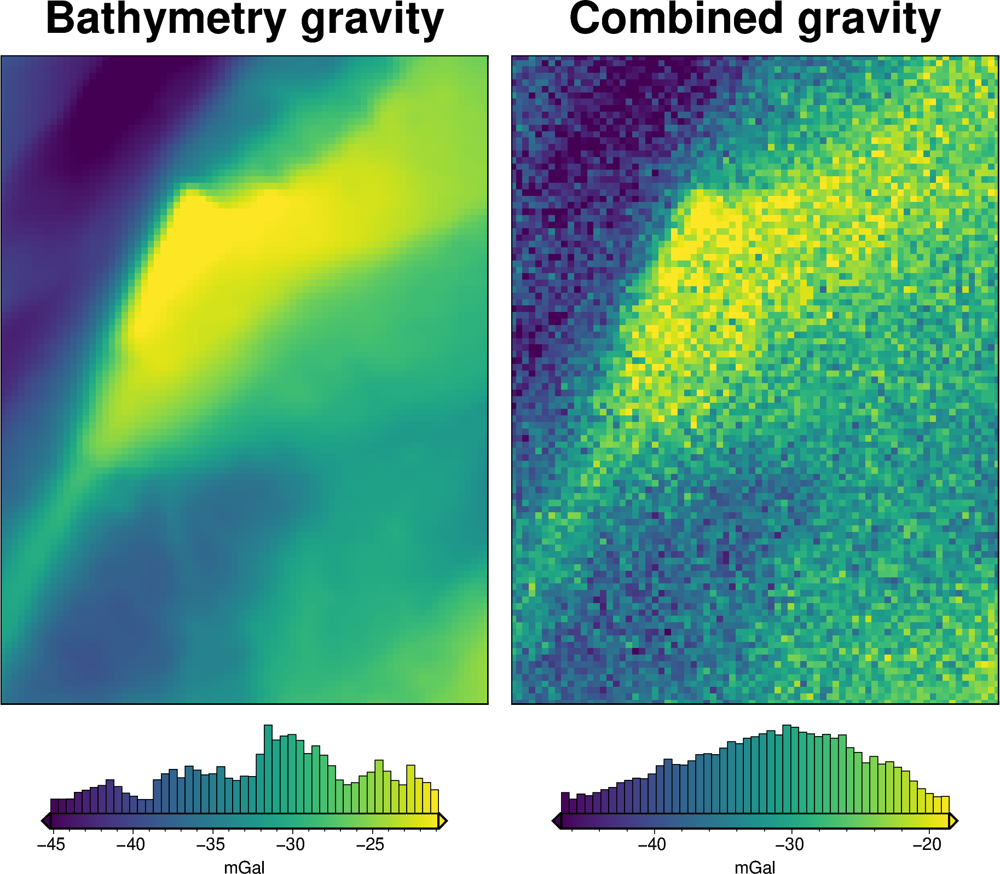

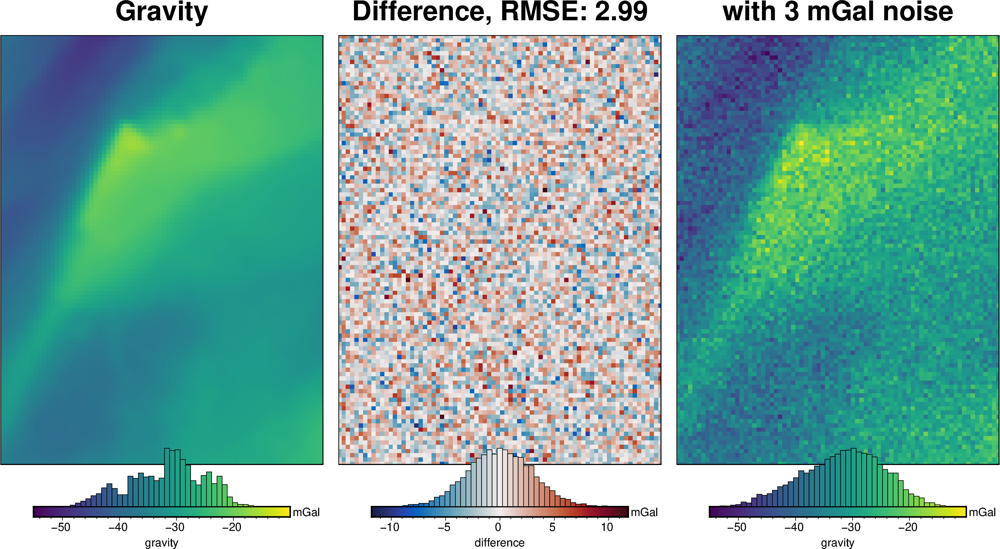

In [3]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = synthetic.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    # gravity_noise=1, # 1 mGal after filtering gives .3 mGal RMSE
    gravity_noise=3,  # 1 mGal after filtering gives .3 mGal RMSE
    gravity_noise_wavelength=2e3,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

In [4]:
filter_widths = np.arange(0, 34e3, 2e3)
filter_widths

array([    0.,  2000.,  4000.,  6000.,  8000., 10000., 12000., 14000.,
       16000., 18000., 20000., 22000., 24000., 26000., 28000., 30000.,
       32000.])

In [ ]:
dfs = []
for f in filter_widths:
    if f == 0:
        grav_df_filt = grav_df.copy()
    else:
        filtered_grav = utils.filter_grid(
            grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly,
            f,
            filt_type="lowpass",
            pad_mode="linear_ramp",
        )

        grav_df_filt = grav_df.copy()
        grav_df_filt["gravity_anomaly"] = filtered_grav.values.ravel()

    # grav_grid = grav_df_filt.set_index(["northing", "easting"]).to_xarray()
    # _ = polar_utils.grd_compare(
    #     grav_grid.noise_free_disturbance,
    #     grav_grid.gravity_anomaly,
    #     grid1_name="Noise-free",
    #     grid2_name=f"with noise and filtered at {round(f/1e3,2)} km",
    #     title="difference",
    #     # region=inversion_region,
    #     plot=True,
    #     hist=True,
    #     inset=False,
    #     # RMSE_decimals=5,
    # )
    dfs.append(
        pd.DataFrame(
            [
                {
                    "filt_width": f,
                    "rmse": utils.rmse(
                        grav_df_filt.noise_free_disturbance
                        - grav_df_filt.gravity_anomaly,
                    ),
                }
            ]
        )
    )
df = pd.concat(dfs, ignore_index=True)
df

,filt_width,rmse
0,0.0,2.028027
1,2000.0,1.871073
2,4000.0,1.510895
3,6000.0,1.158249
4,8000.0,0.897925
5,10000.0,0.725442
6,12000.0,0.602534
7,14000.0,0.518981
8,16000.0,0.471089
9,18000.0,0.431668


In [7]:
# save to a csv
df.to_csv(f"{fpath}_filter_width_rmse.csv", index=False)

Text(0.5, 1.0, 'Low-pass filtering of gravity data')

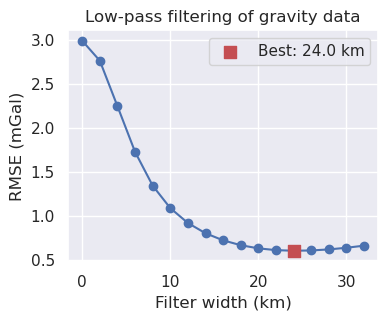

In [6]:
fig, ax = plt.subplots(figsize=(4, 3))
ax.plot(
    df.filt_width / 1e3,
    df.rmse,
    marker="o",
)

best_ind = df.rmse.idxmin()
ax.scatter(
    x=df.iloc[best_ind].filt_width / 1e3,
    y=df.iloc[best_ind].rmse,
    marker="s",
    color="r",
    s=80,
    zorder=20,
    label=f"Best: {round(df.iloc[best_ind].filt_width/1e3, 2)} km",
)
ax.legend()
ax.set_xlabel("Filter width (km)")
ax.set_ylabel("RMSE (mGal)")
ax.set_title("Low-pass filtering of gravity data")

In [8]:
filt_width = df.iloc[df.rmse.idxmin()].filt_width
# filt_width = 10e3
print(f"Filter width: {filt_width/1e3} km")

# filter each line in 1D with a Gaussian filter to remove some noise
filtered_grav = utils.filter_grid(
    grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly,
    filt_width,
    filt_type="lowpass",
    pad_mode="linear_ramp",
)

grav_df = grav_df.copy()
grav_df_filt["gravity_anomaly"] = filtered_grav.values.ravel()

grav_grid = grav_df_filt.set_index(["northing", "easting"]).to_xarray()

Filter width: 24.0 km


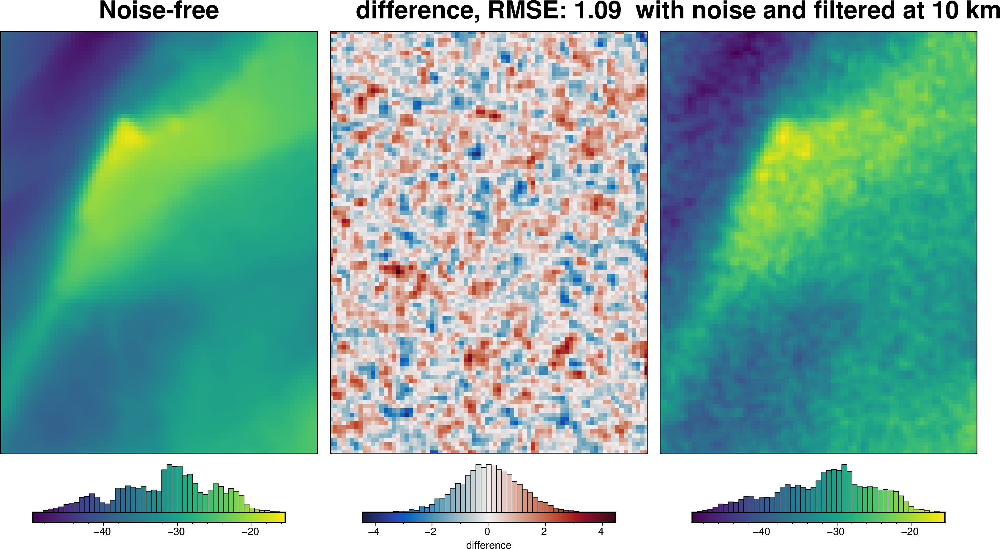

In [6]:
filtered_grav = utils.filter_grid(
    grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly,
    10e3,
    filt_type="lowpass",
    pad_mode="linear_ramp",
)

_ = polar_utils.grd_compare(
    grav_df.set_index(["northing", "easting"]).to_xarray().noise_free_disturbance,
    filtered_grav,
    grid1_name="Noise-free",
    grid2_name="with noise and filtered at 10 km",
    title="difference",
    # region=inversion_region,
    plot=True,
    hist=True,
    inset=False,
    # RMSE_decimals=5,
)

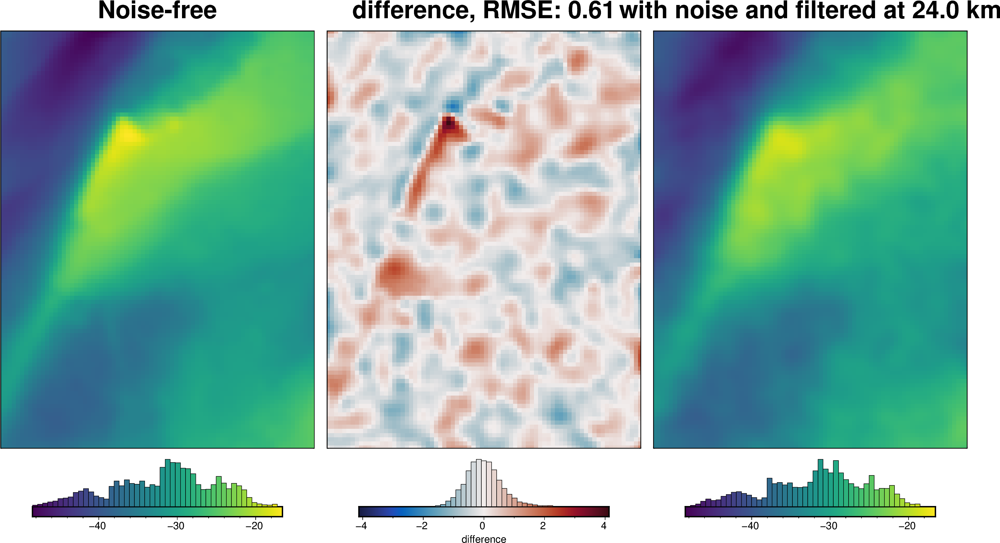

In [9]:
_ = polar_utils.grd_compare(
    grav_grid.noise_free_disturbance,
    grav_grid.gravity_anomaly,
    grid1_name="Noise-free",
    grid2_name=f"with noise and filtered at {round(filt_width/1e3,2)} km",
    title="difference",
    # region=inversion_region,
    plot=True,
    hist=True,
    inset=False,
    # RMSE_decimals=5,
)

In [10]:
grav_df["gravity_anomaly"] = grav_df_filt.gravity_anomaly
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav,noise_free_disturbance,disturbance,uncert,gravity_anomaly
0,-1600000.0,-40000.0,1000.0,-35.551054,0,-35.551054,-36.610774,3,-35.473466
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-38.542478,3,-35.814409
2,-1600000.0,-36000.0,1000.0,-36.473146,0,-36.473146,-37.487424,3,-36.152914
3,-1600000.0,-34000.0,1000.0,-36.755608,0,-36.755608,-32.869103,3,-36.451008
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-39.690063,3,-36.671189
...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-26.837400,3,-25.264014
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-28.896369,3,-24.990153
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-21.663255,3,-24.927625
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-20.191439,3,-25.259400


# Make starting bathymetry model

In [11]:
# semi-regularly spaced
constraint_points = synthetic.constraint_layout_number(
    shape=(6, 7),
    region=inversion_region,
    padding=-spacing,
    shapefile="../results/Ross_Sea_outline.shp",
    add_outside_points=True,
    grid_spacing=spacing,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward
constraint_points.head()

,northing,easting,inside,true_upward,upward
0,-1600000.0,-40000.0,False,-601.093994,-601.093994
1,-1600000.0,-38000.0,False,-609.216919,-609.216919
2,-1600000.0,-36000.0,False,-616.355957,-616.355957
3,-1600000.0,-34000.0,False,-621.262268,-621.262268
4,-1600000.0,-32000.0,False,-625.510925,-625.510925


In [12]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)
starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 121, easting: 96)> Size: 93kB
array([[-541.24413863, -544.57181181, -547.92293683, ..., -360.00006252,
        -357.06767405, -354.19957764],
       [-543.34402682, -546.81675797, -550.35256327, ..., -362.90253223,
        -359.96874156, -357.11431884],
       [-545.05533616, -548.66036832, -552.37518157, ..., -365.66137903,
        -362.73269529, -359.90052822],
       ...,
       [-591.95335284, -595.51882201, -599.06869706, ..., -440.89315875,
        -440.6944619 , -440.40553782],
       [-590.53134834, -594.09076638, -597.64079289, ..., -440.69158328,
        -440.42525249, -440.07197234],
       [-589.16632672, -592.73504778, -596.3020968 , ..., -440.51760947,
        -440.1713932 , -439.74434037]], shape=(121, 96))
Coordinates:
  * easting   (easting) float64 768B -6e+04 -5.8e+04 ... 1.28e+05 1.3e+05
  * northing  (northing) float64 968B -1.62e+06 -1.618e+06 ... -1.38e+06
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [13]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.starting_bathymetry)
print(f"RMSE: {rmse:.2f} m")

RMSE: 0.03 m


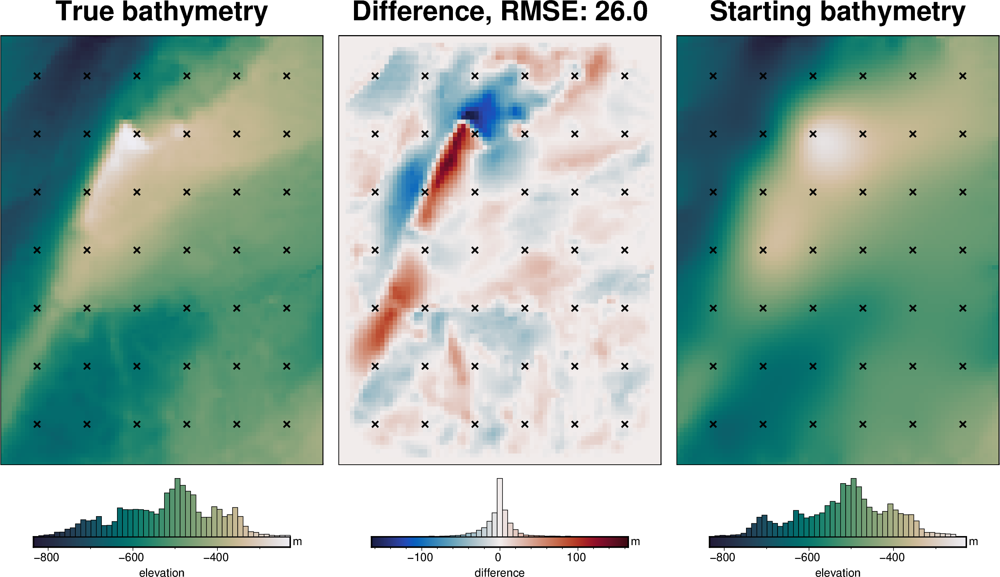

In [14]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    plot_type="pygmt",
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    label_font="16p,Helvetica,black",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [15]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350

# set the reference level from the prisms to 0
zref = 0

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/7676 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav,noise_free_disturbance,disturbance,uncert,gravity_anomaly,starting_gravity
0,-1600000.0,-40000.0,1000.0,-35.551054,0,-35.551054,-36.610774,3,-35.473466,-32.541367
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-38.542478,3,-35.814409,-32.965831
2,-1600000.0,-36000.0,1000.0,-36.473146,0,-36.473146,-37.487424,3,-36.152914,-33.347648
3,-1600000.0,-34000.0,1000.0,-36.755608,0,-36.755608,-32.869103,3,-36.451008,-33.644496
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-39.690063,3,-36.671189,-33.840063
...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-26.837400,3,-25.264014,-23.321506
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-28.896369,3,-24.990153,-23.482116
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-21.663255,3,-24.927625,-23.605602
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-20.191439,3,-25.259400,-23.693171


In [16]:
regional_grav_kwargs = dict(
    method="constant",
    # constant=0,
    constraints_df=constraint_points,
)
grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

grav_df

INFO:invert4geom:using median gravity misfit of constraint points for regional field: -2.6793731451034546 mGal


,northing,easting,upward,bathymetry_grav,basement_grav,noise_free_disturbance,disturbance,uncert,gravity_anomaly,starting_gravity,misfit,reg,res
0,-1600000.0,-40000.0,1000.0,-35.551054,0,-35.551054,-36.610774,3,-35.473466,-32.541367,-2.932099,-2.679373,-0.252726
1,-1600000.0,-38000.0,1000.0,-36.054657,0,-36.054657,-38.542478,3,-35.814409,-32.965831,-2.848579,-2.679373,-0.169205
2,-1600000.0,-36000.0,1000.0,-36.473146,0,-36.473146,-37.487424,3,-36.152914,-33.347648,-2.805266,-2.679373,-0.125893
3,-1600000.0,-34000.0,1000.0,-36.755608,0,-36.755608,-32.869103,3,-36.451008,-33.644496,-2.806512,-2.679373,-0.127139
4,-1600000.0,-32000.0,1000.0,-36.951029,0,-36.951029,-39.690063,3,-36.671189,-33.840063,-2.831126,-2.679373,-0.151753
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0,-25.760090,-26.837400,3,-25.264014,-23.321506,-1.942508,-2.679373,0.736865
7672,-1400000.0,104000.0,1000.0,-25.911429,0,-25.911429,-28.896369,3,-24.990153,-23.482116,-1.508037,-2.679373,1.171336
7673,-1400000.0,106000.0,1000.0,-26.032814,0,-26.032814,-21.663255,3,-24.927625,-23.605602,-1.322022,-2.679373,1.357351
7674,-1400000.0,108000.0,1000.0,-26.121903,0,-26.121903,-20.191439,3,-25.259400,-23.693171,-1.566230,-2.679373,1.113143


makecpt [ERROR]: Option T: min >= max
ERROR:polartoolkit:Module 'makecpt' failed with status code 72:
makecpt [ERROR]: Option T: min >= max
Traceback (most recent call last):
  File "/home/sungw937/polartoolkit/src/polartoolkit/maps.py", line 1026, in set_cmap
    pygmt.makecpt(
  File "/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/pygmt/helpers/decorators.py", line 595, in new_module
    return module_func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/pygmt/helpers/decorators.py", line 758, in new_module
    return module_func(*bound.args, **bound.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/pygmt/src/makecpt.py", line 164, in makecpt
    lib.call_module(module="makecpt", args=build_arg_list(kwargs, outfile=output))
  Fi

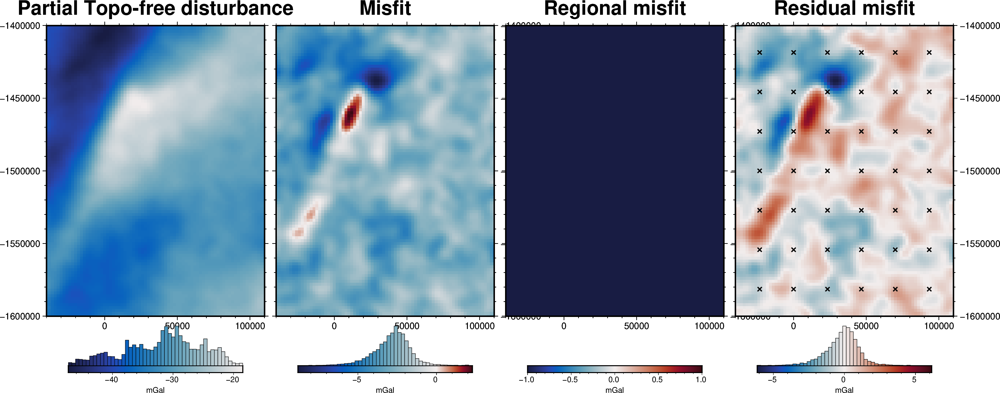

In [17]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)
fig.show()

In [18]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": grav_df.uncert.mean()
    ** 0.5,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
}

# Damping Cross Validation

In [19]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    # damping_cv_startup_trials=6, # force 6 startup trials in grid search
    # plot_cv=True,
    # plot_grids=True,
    fname=f"{fpath}_damping_cv",
    **kwargs,
)

INFO:invert4geom:saving all results with root name '../results/Ross_Sea/Ross_Sea_02_damping_cv'
INFO:invert4geom:running damping cross validation
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 7
INFO:invert4geom:	parameter: {'damping': 0.014060592918098937}
INFO:invert4geom:	scores: [0.015176300340288986]
INFO:invert4geom:results saved to ../results/Ross_Sea/Ross_Sea_02_damping_cv_results.pickle.pickle


In [20]:
# load saved inversion results
with pathlib.Path(f"{fpath}_damping_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [21]:
best_damping = parameters.get("Solver damping")
kwargs["solver_damping"] = best_damping
best_damping

0.014060592918098937

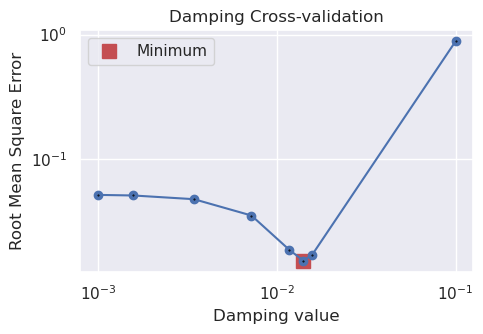

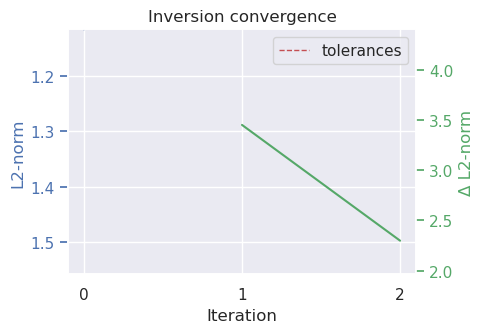

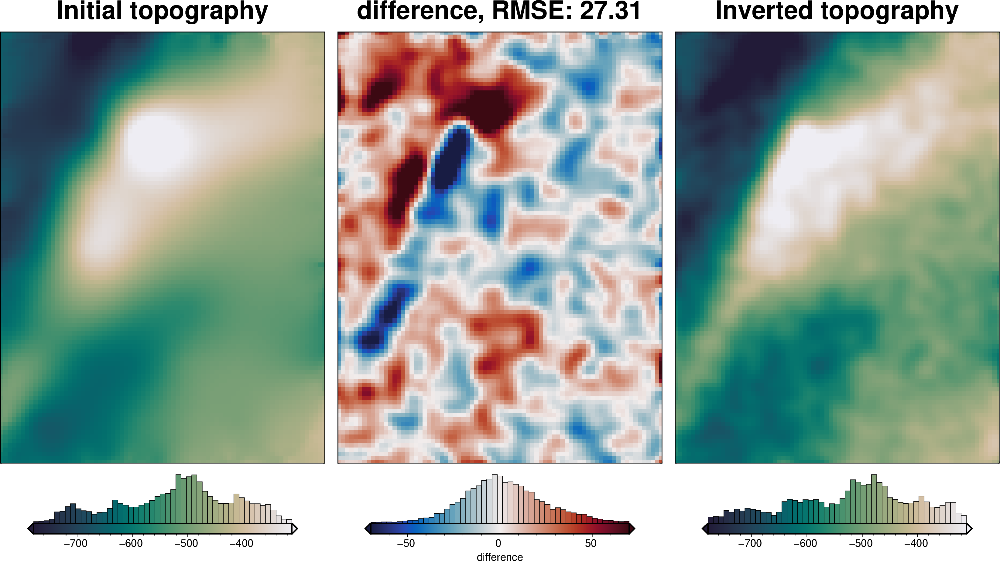

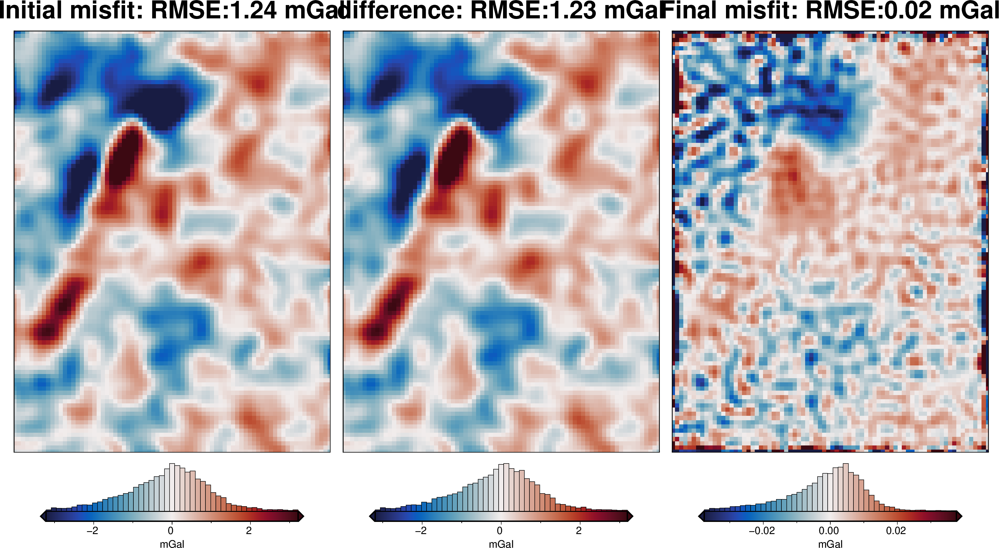

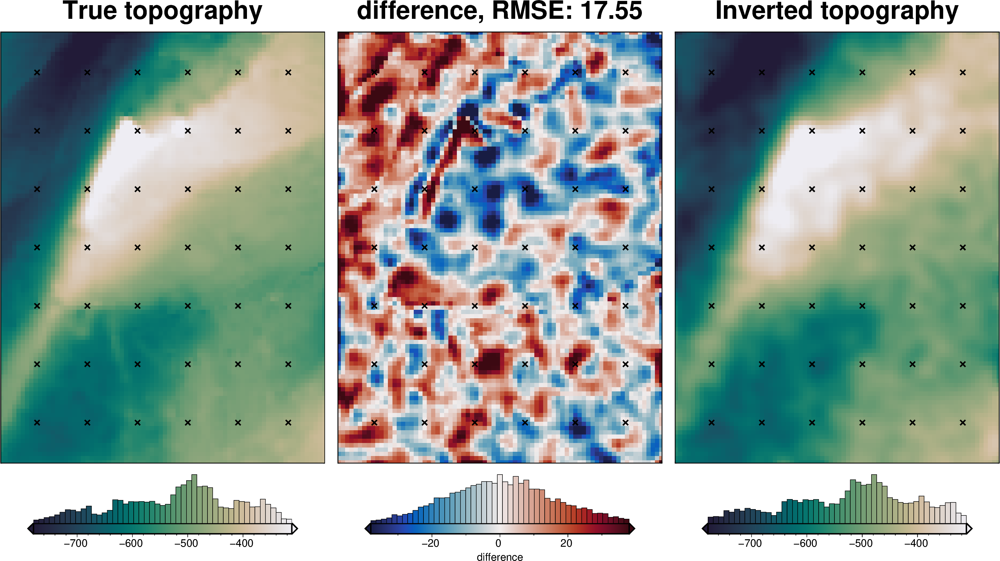

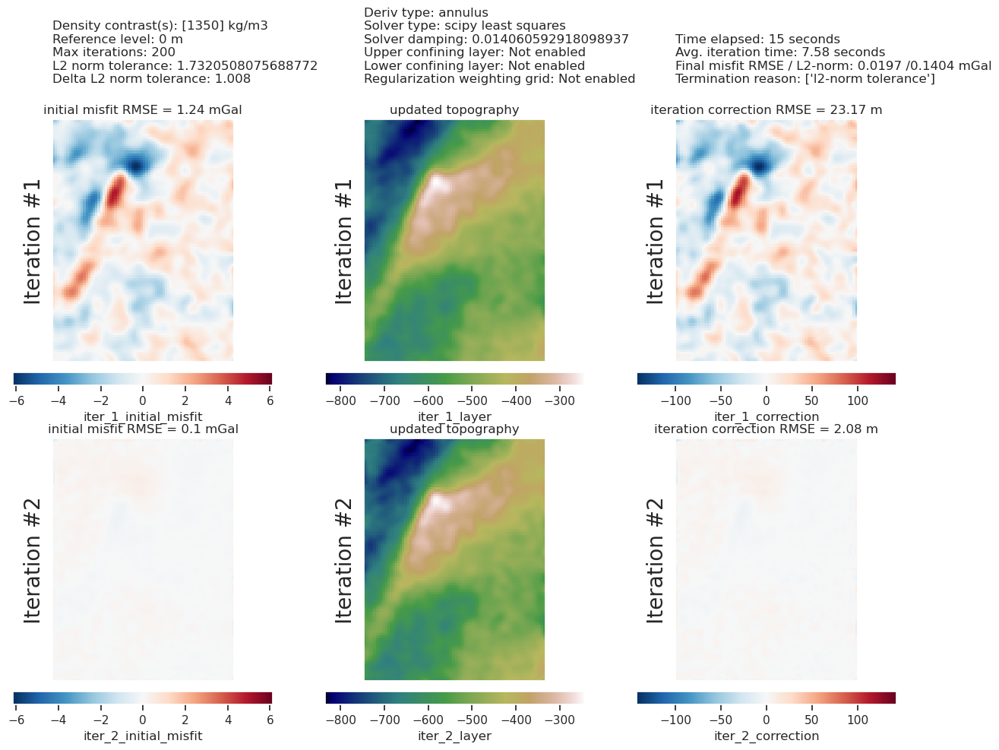

In [22]:
study_df = study.trials_dataframe()

plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)

plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [23]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 22.58 m


# Density CV

In [24]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_topography=starting_bathymetry,
    zref=0,
    calculate_regional_misfit=True,
    # regional_grav_kwargs=regional_grav_kwargs,
    regional_grav_kwargs=dict(
        grav_df=grav_df,
        method="constant",
        constant=0,
    ),
    run_zref_or_density_cv=True,
    constraints_df=constraint_points,
    density_contrast_limits=(1000, 2400),
    zref_density_cv_trials=10,
    # plot_cv=True,
    fname=f"{fpath}_density_cv",
    **kwargs,
)

INFO:invert4geom:saving all results with root name '../results/Ross_Sea/Ross_Sea_02_density_cv'
INFO:invert4geom:running zref and/or density contrast cross validation
INFO:invert4geom:using 4 startup trials


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 8
INFO:invert4geom:	parameter: {'density_contrast': 1471}
INFO:invert4geom:	scores: [19.538215649782178]
INFO:invert4geom:results saved to ../results/Ross_Sea/Ross_Sea_02_density_cv_results.pickle


In [25]:
# load saved inversion results
with pathlib.Path(f"{fpath}_density_cv_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results


# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

In [26]:
best_density_contrast = study.best_params["density_contrast"]
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)

optimal determined density contrast 1471
real density contrast 1476


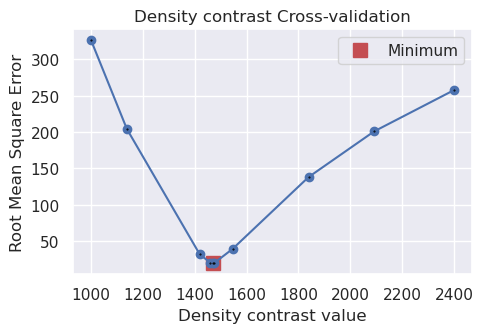

In [27]:
study_df = study.trials_dataframe()

fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_density_contrast,
    param_name="Density contrast",
)

### Redo with optimal density contrast
During the density cross-validation to avoid biasing the scores, we had to manually set a regional field. Now, with the optimal density contrast value found, we can rerun the inversion with an automatically determined regional field strength (the average value misfit at the constraints).

In [28]:
density_contrast = best_density_contrast

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **regional_grav_kwargs,
)

  0%|          | 0/7676 [00:00<?, ?it/s]

INFO:invert4geom:using median gravity misfit of constraint points for regional field: 0.016305758617818356 mGal


makecpt [ERROR]: Option T: min >= max
ERROR:polartoolkit:Module 'makecpt' failed with status code 72:
makecpt [ERROR]: Option T: min >= max
Traceback (most recent call last):
  File "/home/sungw937/polartoolkit/src/polartoolkit/maps.py", line 1026, in set_cmap
    pygmt.makecpt(
  File "/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/pygmt/helpers/decorators.py", line 595, in new_module
    return module_func(*args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/pygmt/helpers/decorators.py", line 758, in new_module
    return module_func(*bound.args, **bound.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/sungw937/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/pygmt/src/makecpt.py", line 164, in makecpt
    lib.call_module(module="makecpt", args=build_arg_list(kwargs, outfile=output))
  Fi

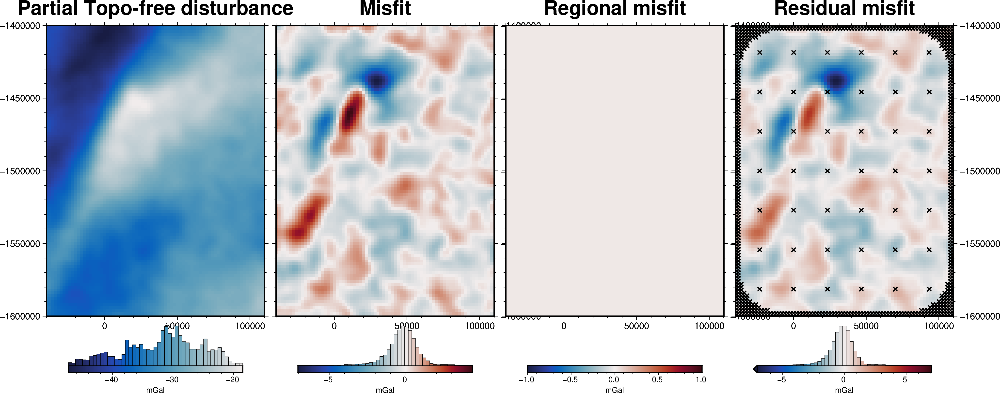

In [29]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points,
    points_style="x.2c",
)
fig.show()

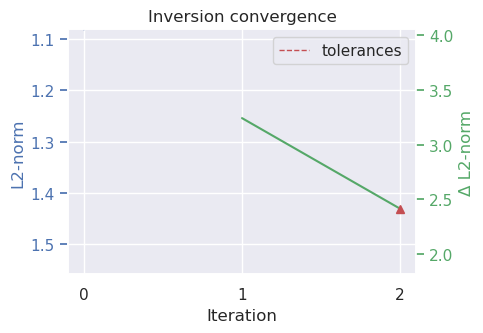

In [30]:
# run the inversion workflow
inversion_results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    fname=f"{fpath}_optimal",
    starting_prisms=starting_prisms,
    plot_dynamic_convergence=True,
    **kwargs,
)

In [31]:
# load saved inversion results
with pathlib.Path(f"{fpath}_optimal_results.pickle").open("rb") as f:
    results = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

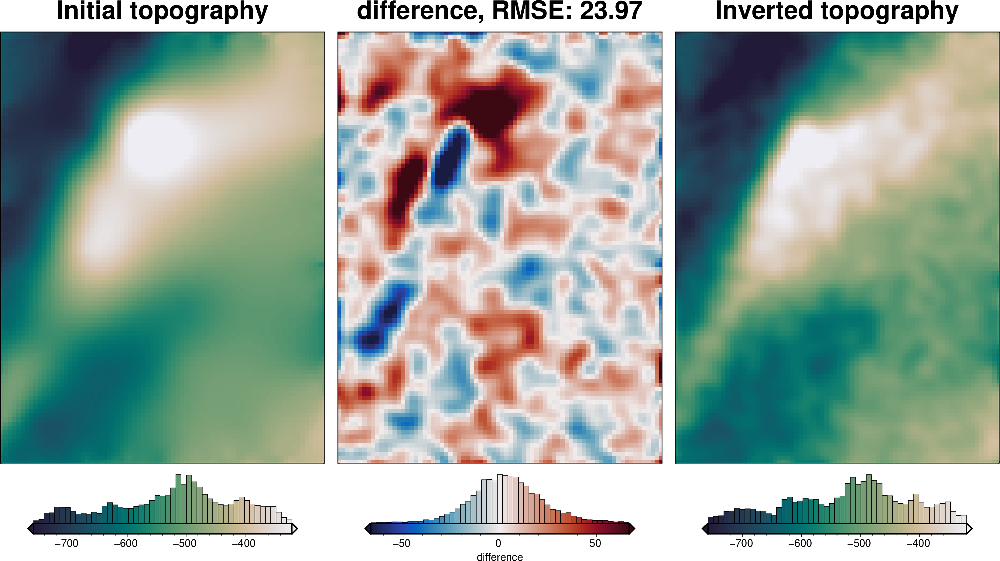

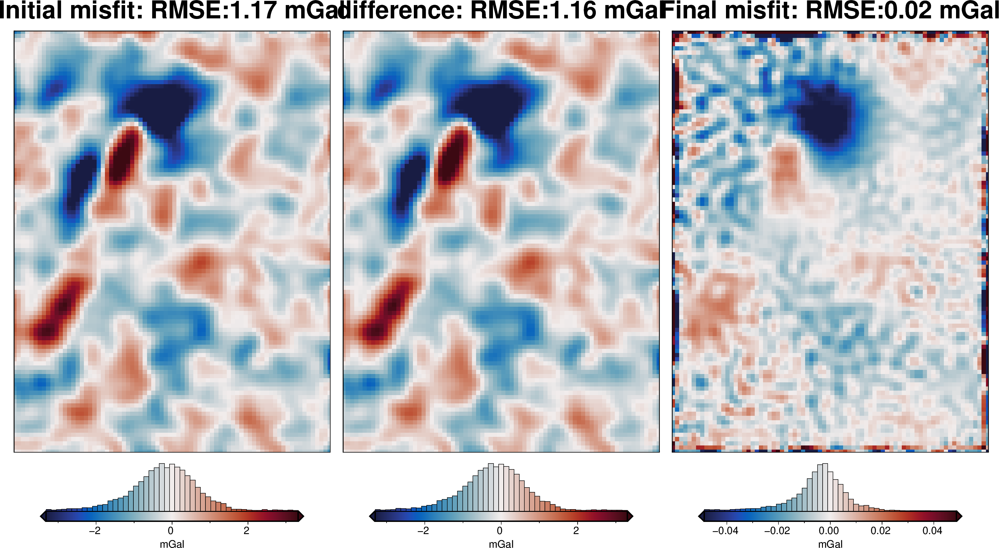

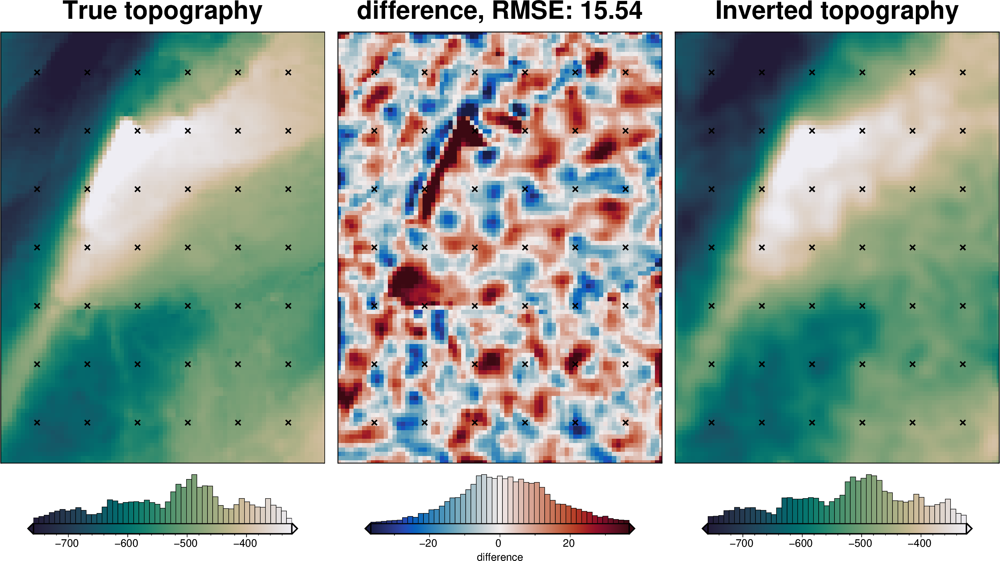

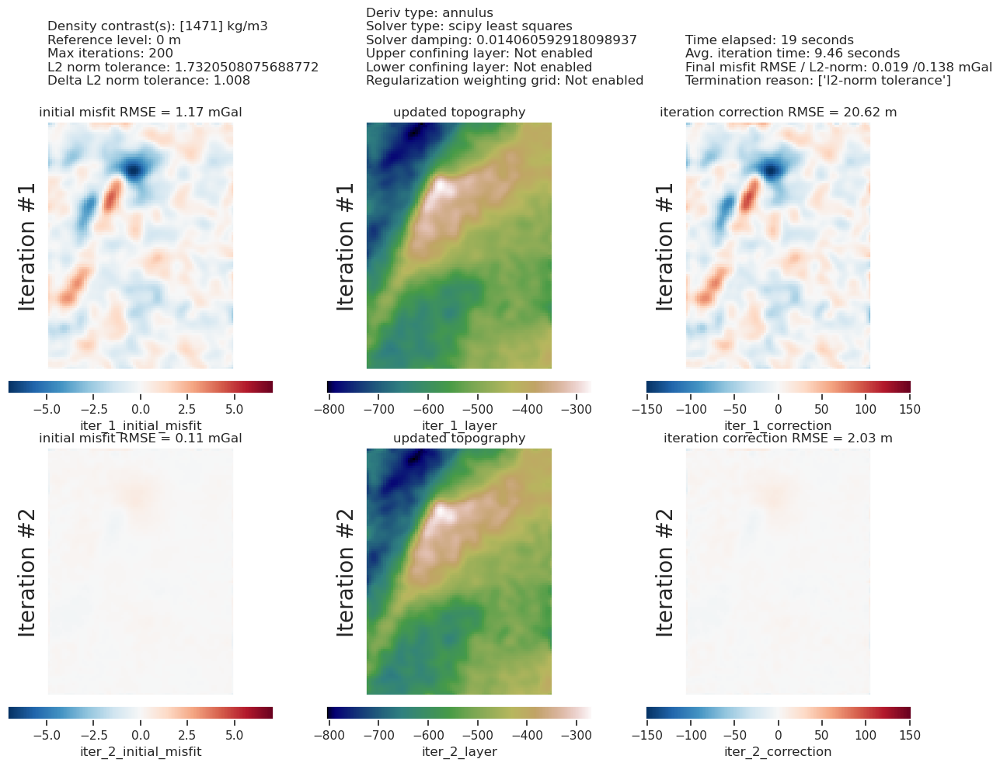

In [32]:
plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [33]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 19.53 m


In [34]:
# save to csv
constraint_points.to_csv(f"{fpath}_constraint_points.csv", index=False)

# Uncertainty analysis

## Inversion error

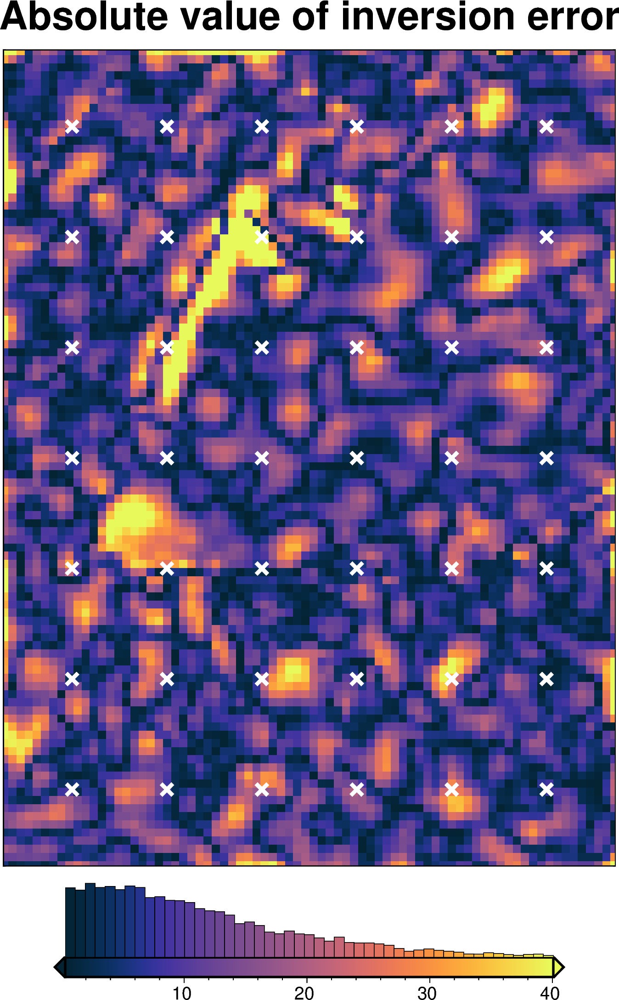

In [35]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    region=inversion_region,
    # region=vd.pad_region(inversion_region, -3*spacing),
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points[constraint_points.inside],
    points_style="x.3c",
    points_fill="white",
    points_pen="2p",
)
fig.show()

In [36]:
# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=regional_grav_kwargs,
    **kwargs,
)

## Solver damping component

In [37]:
# load study
with pathlib.Path(f"{fpath}_damping_cv_damping_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
stdev = stdev / 2
print(f"using stdev: {stdev}")

calculated stdev: 0.4792126913358705
using stdev: 0.23960634566793526


best: 0.014060592918098937 
std: 0.23960634566793526 
+1std: 0.024412372068438826 
-1std: 0.008098363921959385


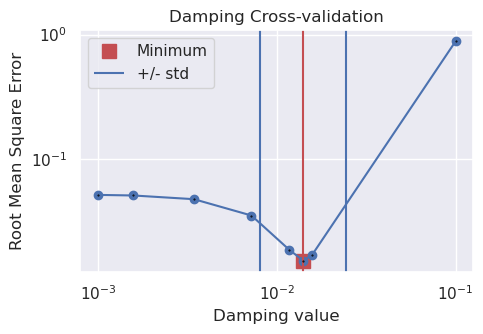

In [38]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.016040130109428345, min: 0.005673959976801983, max: 0.034843438095579216
INFO:invert4geom:No pickle files starting with '../results/Ross_Sea/Ross_Sea_02_uncertainty_damping' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../results/Ross_Sea/Ross_Sea_02_uncertainty_damping'



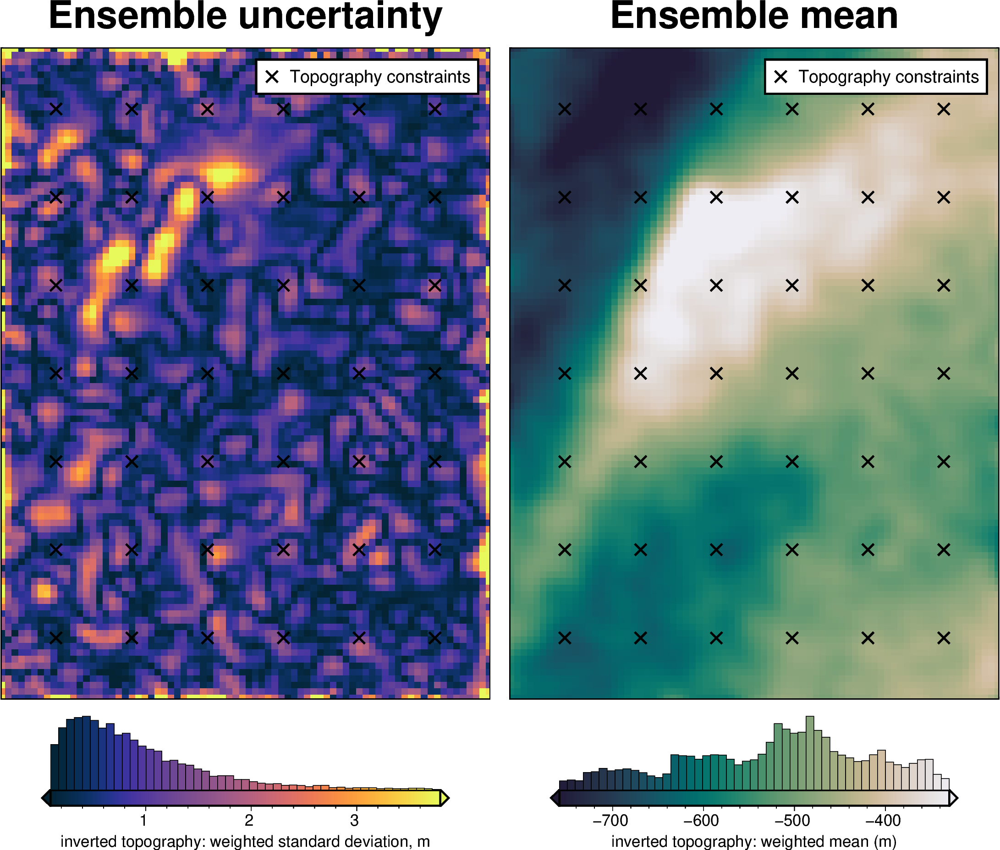

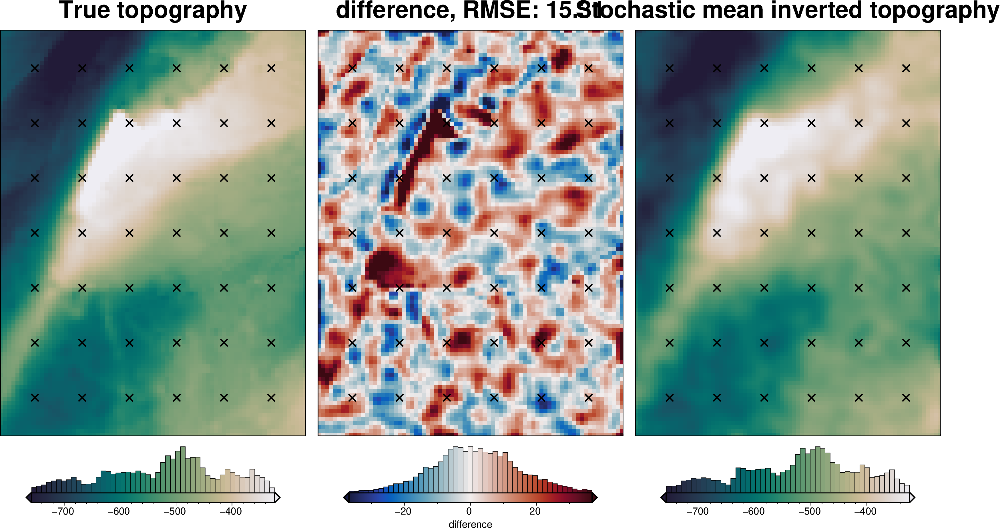

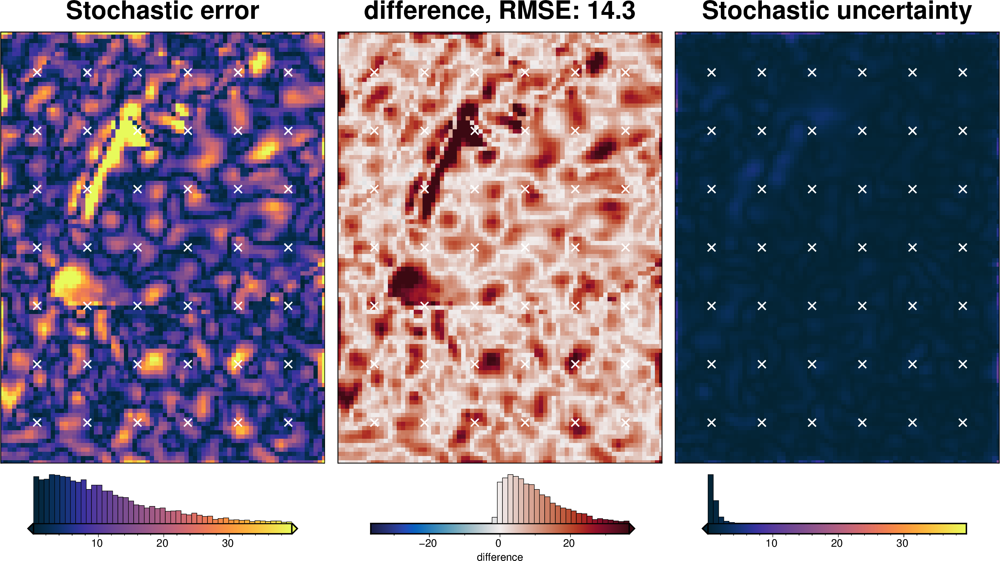

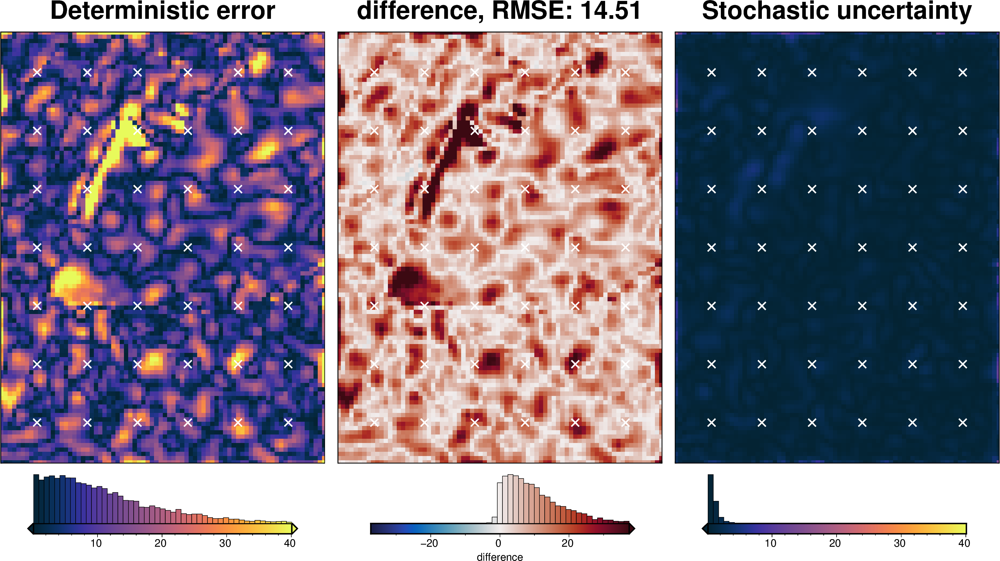

In [39]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(best_damping),  # mean of base 10 exponent
        "scale": stdev,  # standard deviation of base 10 exponent
        "log": True,
    },
}
fname = f"{fpath}_uncertainty_damping"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_damping_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Density component

In [40]:
# load study
with pathlib.Path(f"{fpath}_density_cv_zref_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
stdev = 5
print(f"using stdev: {stdev}")

print(
    f"density estimation error: {np.abs(true_density_contrast - best_density_contrast)}"
)

calculated stdev: 421.3222572383809
using stdev: 5
density estimation error: 5


best: 1471 
std: 5 
+1std: 1476 
-1std: 1466


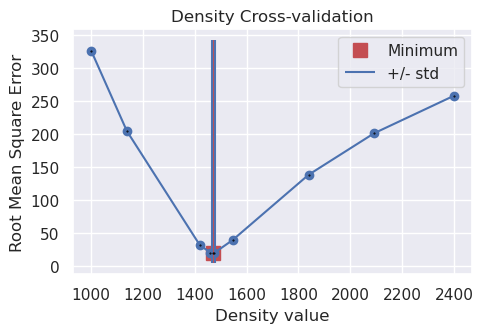

In [41]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.values,
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1471.0, min: 1462.7757318652427, max: 1479.2242681347573
INFO:invert4geom:No pickle files starting with '../results/Ross_Sea/Ross_Sea_02_uncertainty_density' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../results/Ross_Sea/Ross_Sea_02_uncertainty_density'



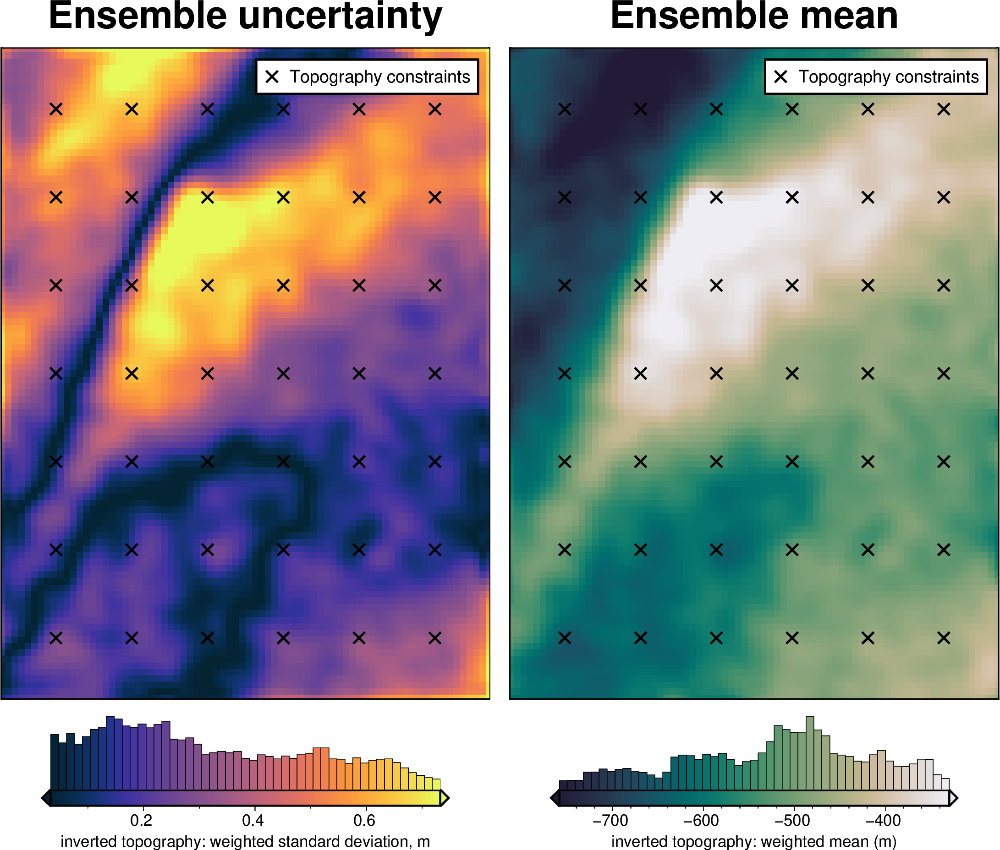

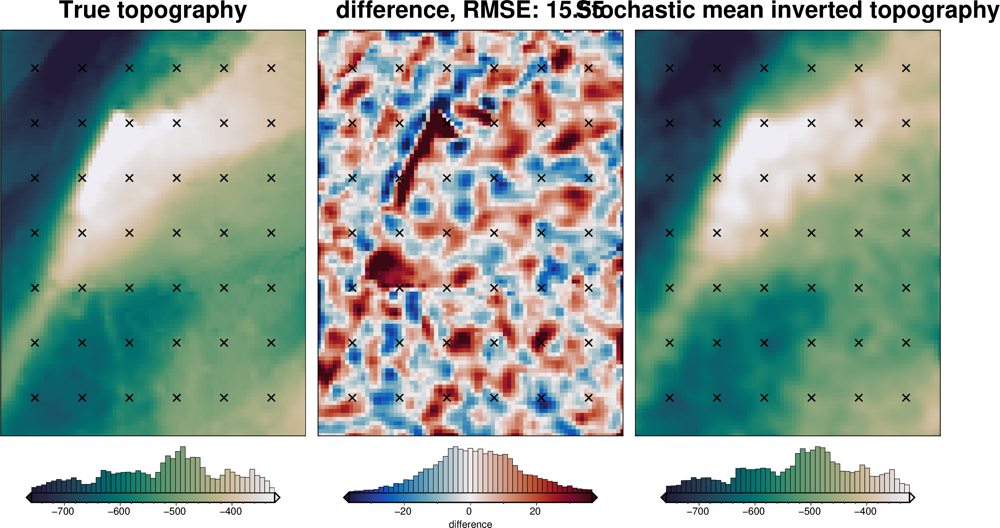

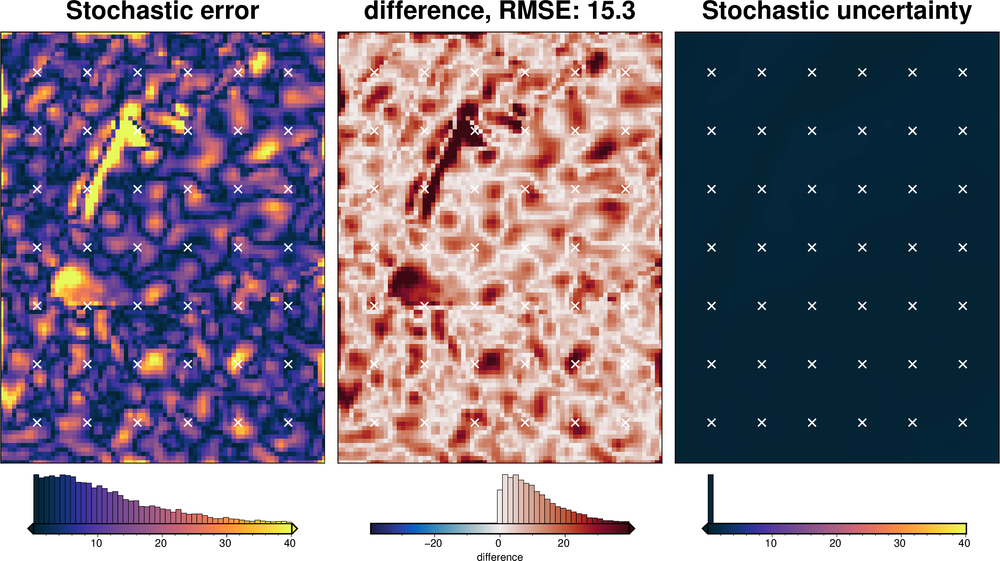

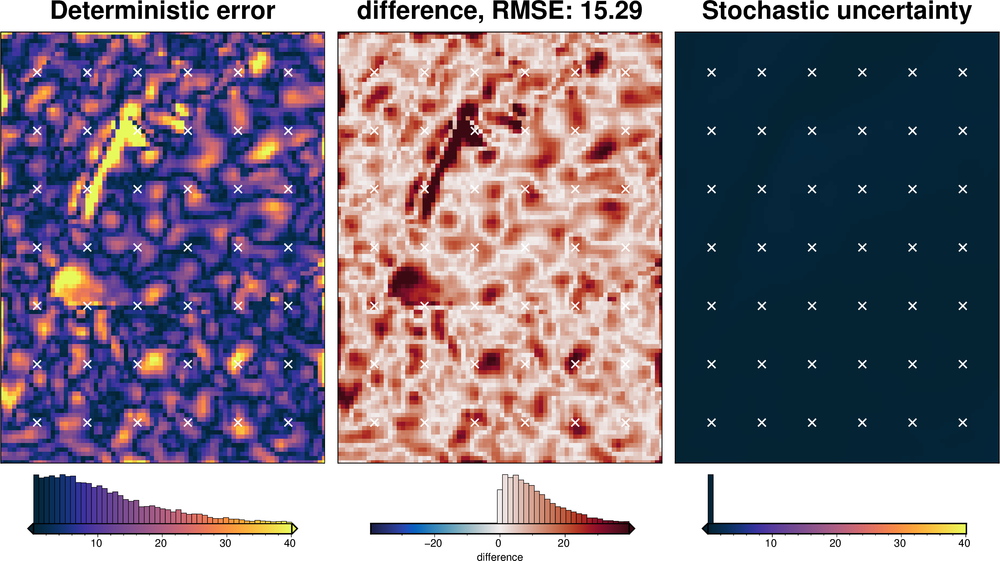

In [42]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = f"{fpath}_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_density_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Gravity component

INFO:invert4geom:No pickle files starting with '../results/Ross_Sea/Ross_Sea_02_uncertainty_grav_filter' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../results/Ross_Sea/Ross_Sea_02_uncertainty_grav_filter'



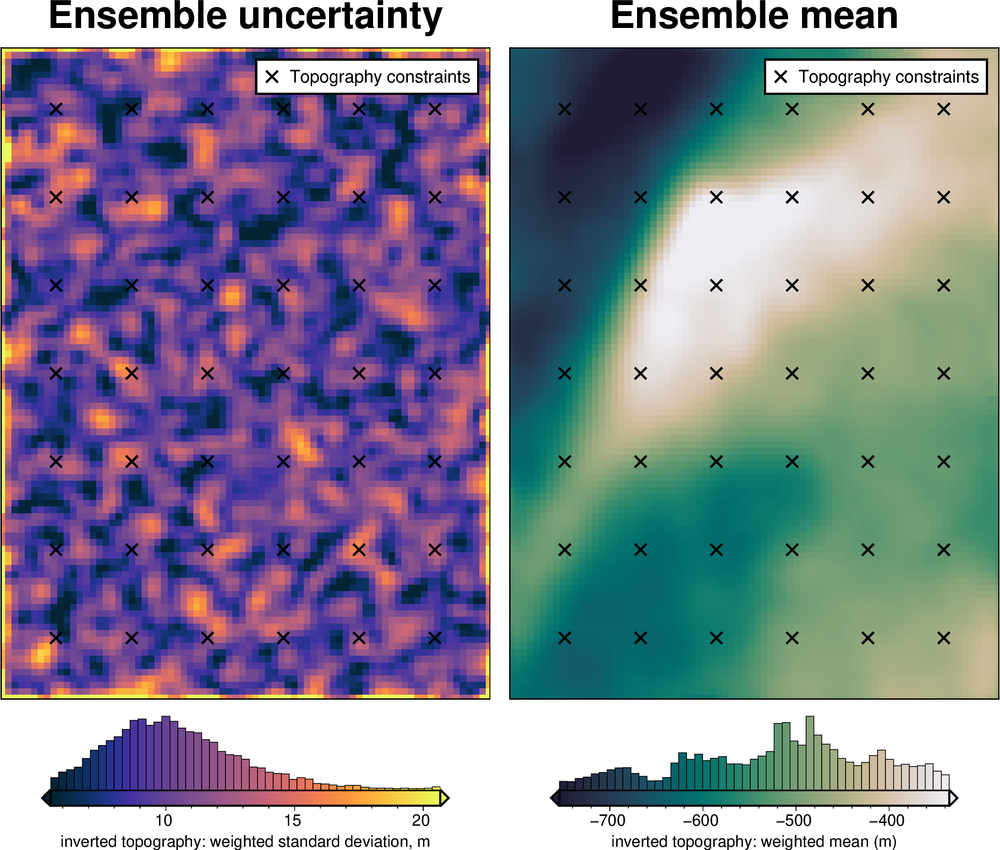

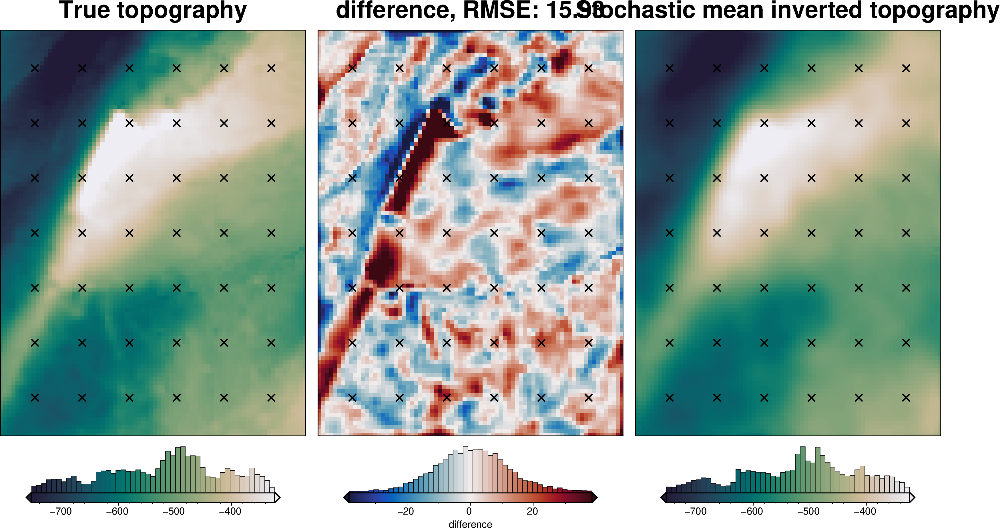

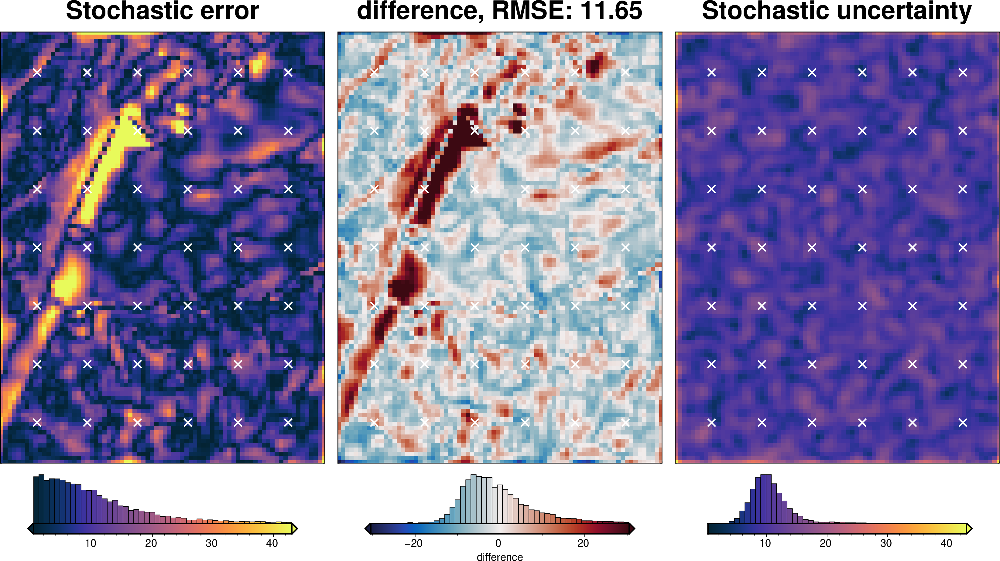

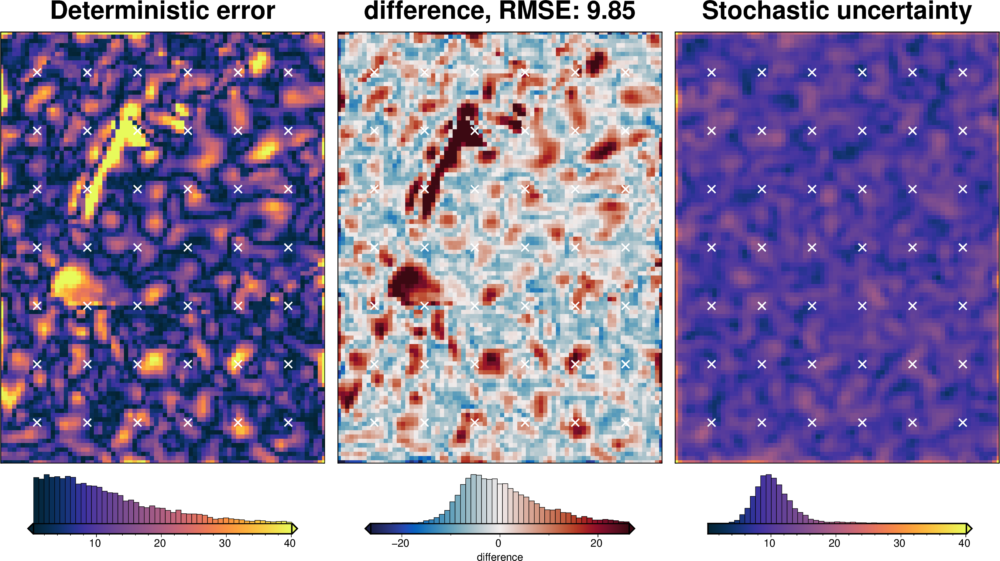

In [43]:
fname = f"{fpath}_uncertainty_grav_filter"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_grav_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    sample_gravity=True,
    gravity_filter_width=filt_width,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_grav_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points[constraint_points.inside],
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Total uncertainty

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.01619272244277795, min: 0.004768522396729735, max: 0.04145944105118971
INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1470.9999999999998, min: 1461.2001800772998, max: 1480.7998199227002
INFO:invert4geom:No pickle files starting with '../results/Ross_Sea/Ross_Sea_02_uncertainty_full' found, creating new files



stochastic ensemble:   0%|          | 0/20 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 20
saving results to pickle files with prefix: '../results/Ross_Sea/Ross_Sea_02_uncertainty_full'



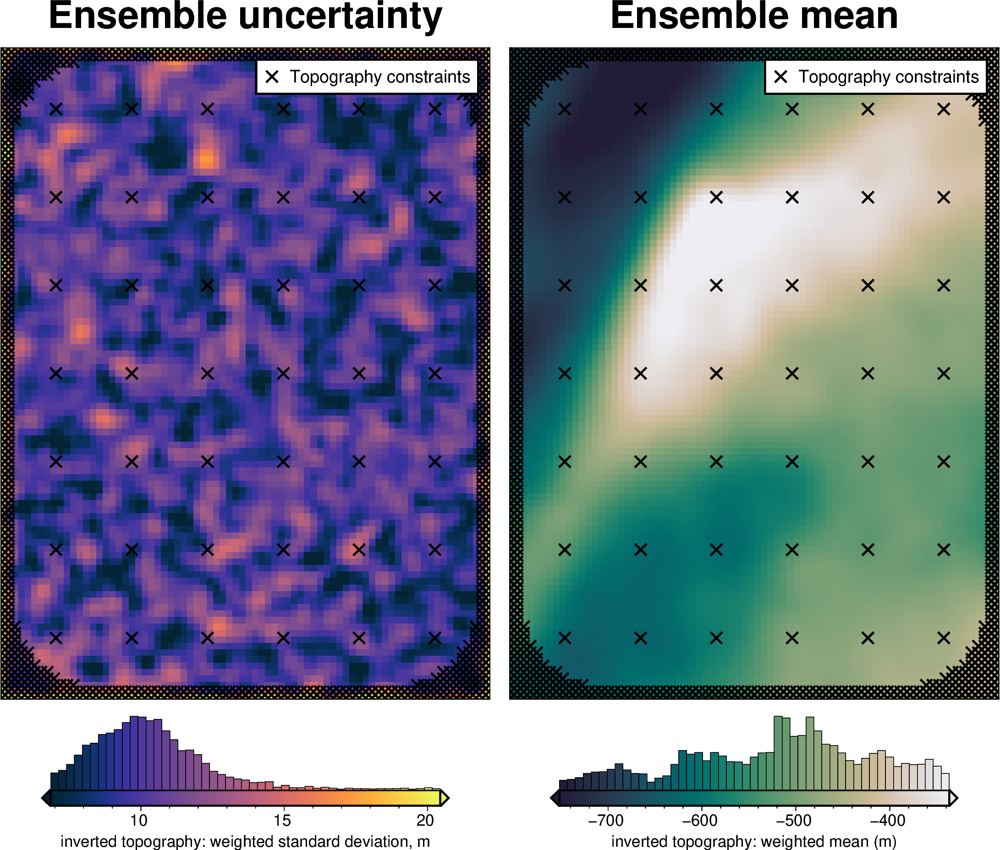

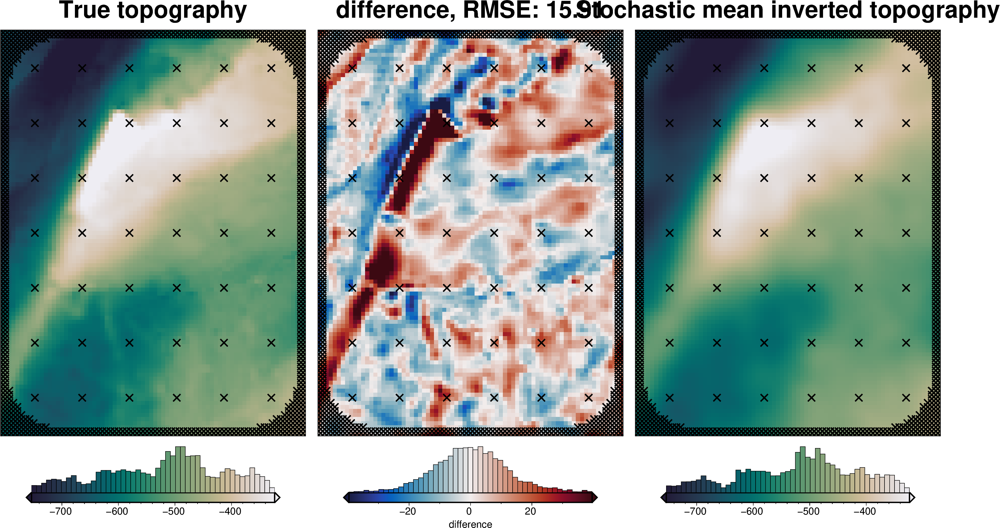

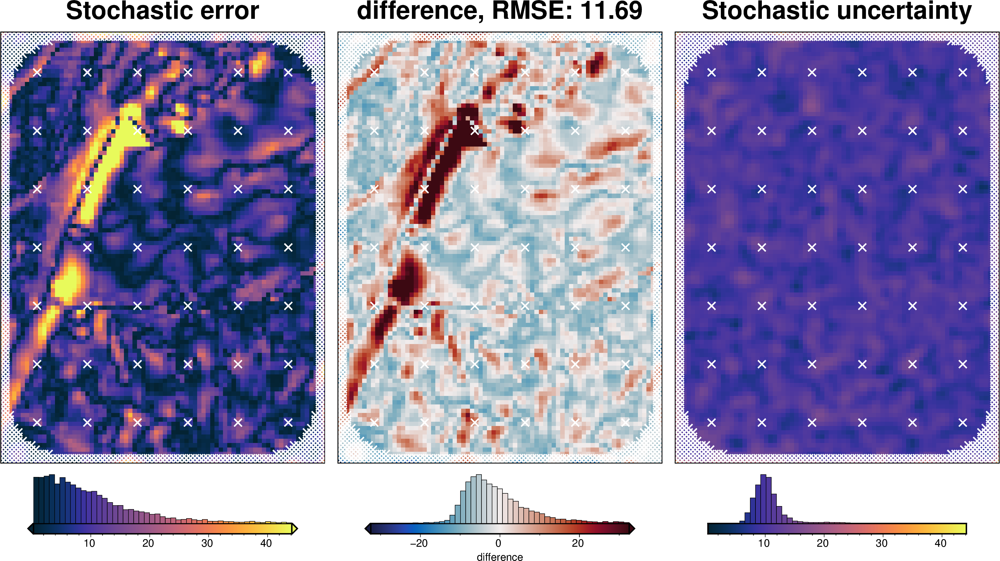

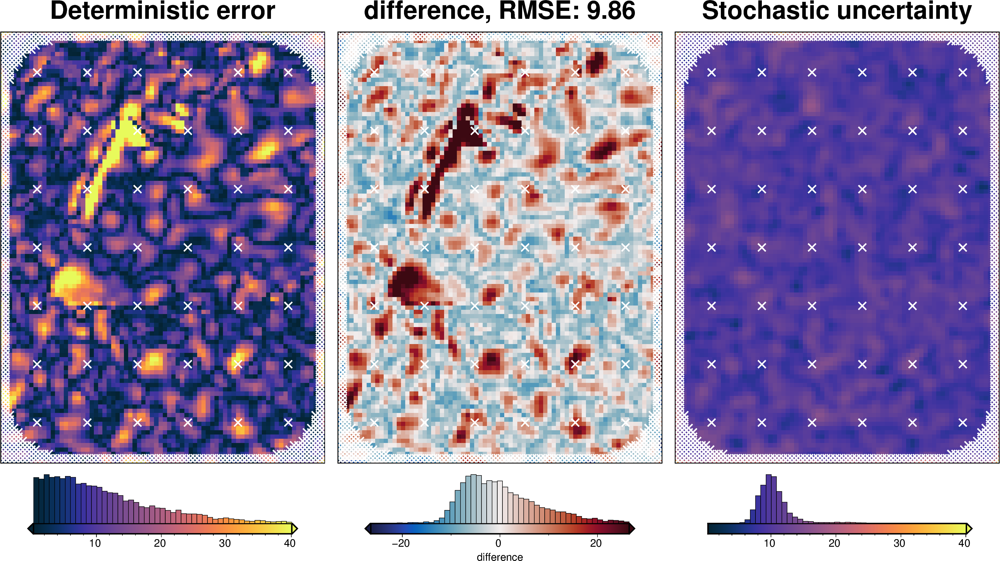

In [44]:
fname = f"{fpath}_uncertainty_full"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    sample_gravity=True,
    gravity_filter_width=filt_width,
    parameter_dict=solver_dict | density_dict,
    **uncert_kwargs,
)

stats_ds = synth_plotting.uncert_plots(
    uncert_results,
    inversion_region,
    bathymetry,
    deterministic_bathymetry=final_topography,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

### Comparing results

In [45]:
results = [
    uncert_results,
    uncert_grav_results,
    uncert_density_results,
    uncert_damping_results,
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        region=inversion_region,
    )
    stats.append(ds)

In [46]:
names = [
    "full",
    "gravity",
    "density",
    "damping",
]

# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 247kB
Dimensions:        (northing: 101, easting: 76)
Coordinates:
  * northing       (northing) float64 808B -1.6e+06 -1.598e+06 ... -1.4e+06
  * easting        (easting) float64 608B -4e+04 -3.8e+04 ... 1.08e+05 1.1e+05
Data variables:
    full_stdev     (northing, easting) float64 61kB 33.4 24.75 ... 16.78 26.5
    gravity_stdev  (northing, easting) float64 61kB 40.12 27.22 ... 13.68 20.22
    density_stdev  (northing, easting) float64 61kB 0.119 0.1515 ... 0.7546
    damping_stdev  (northing, easting) float64 61kB 3.629 1.588 ... 1.697 8.544

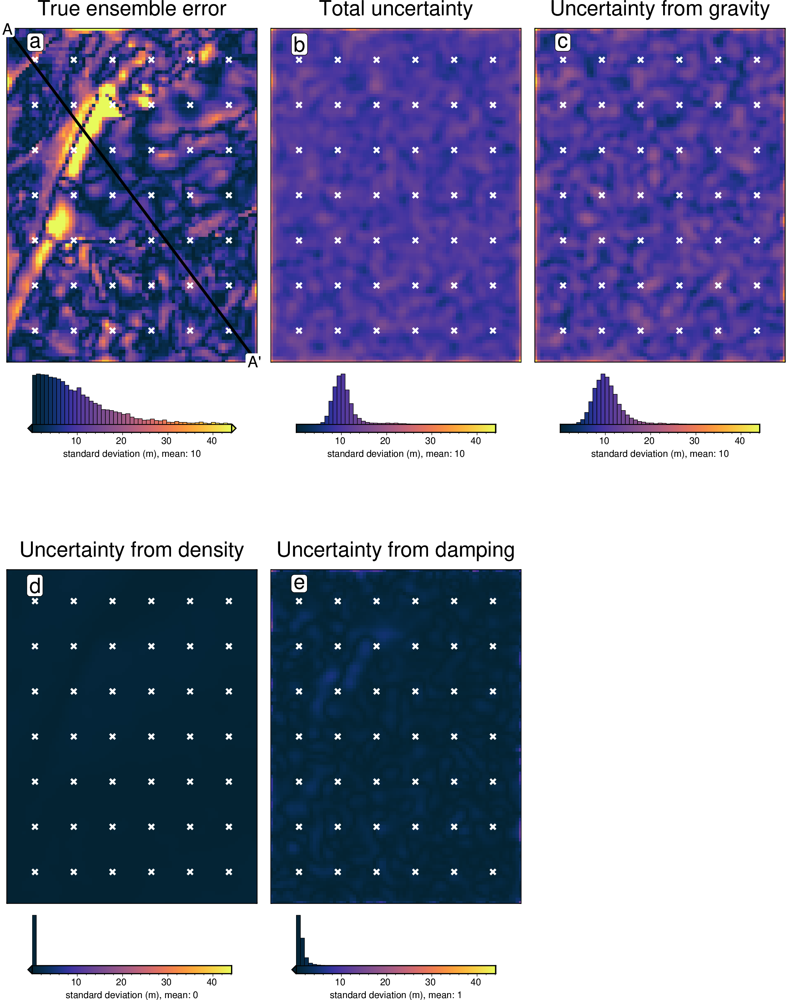

In [47]:
titles = [
    "True ensemble error",
    # "True indiv error",
    "Total uncertainty",
    "Uncertainty from gravity",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

# cpt_lims = polar_utils.get_min_max(grids[0], robust=True,)
cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 3:
        origin_shift = "both_shift"
        xshift_amount = -2
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points[constraint_points.inside].easting,
        y=constraint_points[constraint_points.inside].northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

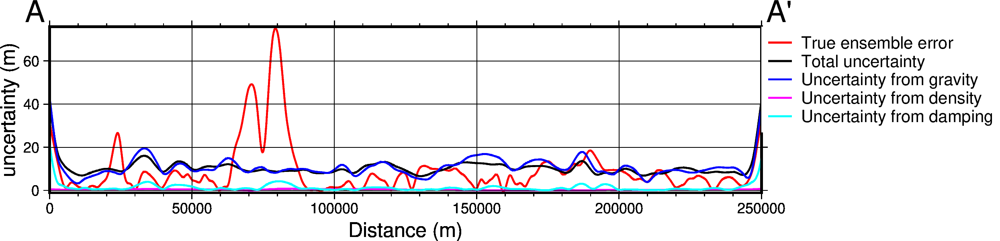

In [48]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    # data_pen_thickness=[1, 1.5, 1],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

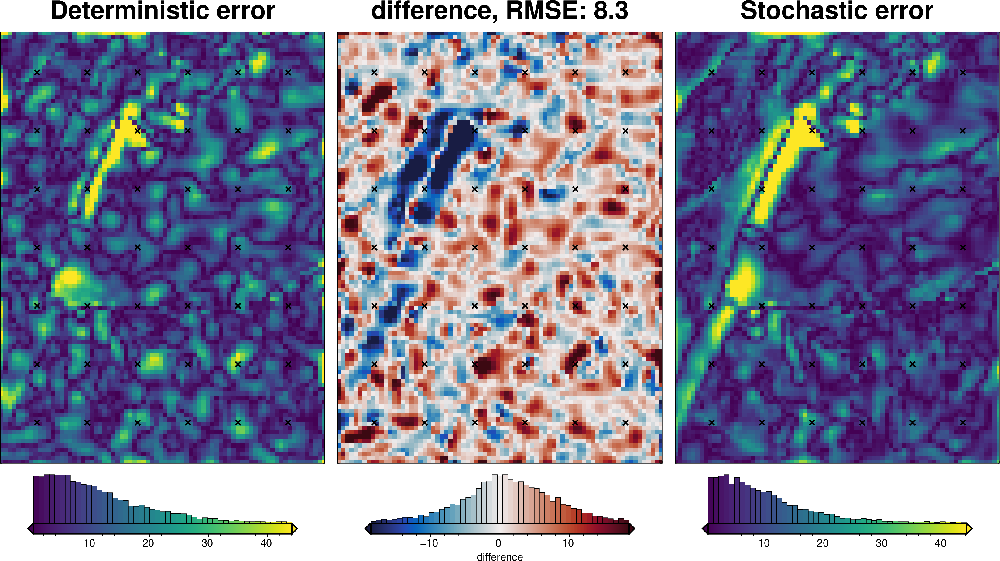

In [49]:
_ = polar_utils.grd_compare(
    inversion_error,
    np.abs(stats[0].weighted_mean - bathymetry),
    region=inversion_region,
    plot=True,
    grid1_name="Deterministic error",
    grid2_name="Stochastic error",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    points=constraint_points[constraint_points.inside],
    points_style="x.2c",
)

In [50]:
# save results
merged.to_netcdf(f"{fpath}_sensitivity.nc")

In [51]:
stats_ds.to_netcdf(f"{fpath}_uncertainty.nc")